In [15]:
import pandas as pd

loading dataset


In [16]:
df=pd.read_csv('Dataset .csv')
df.head(1)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314


cleaning data

In [17]:
df = df.dropna(subset=["Latitude", "Longitude"])


In [18]:
df[["Latitude", "Longitude"]].describe()


,Latitude,Longitude
count,9551.000000,9551.000000
mean,25.854381,64.126574
std,11.007935,41.467058
min,-41.330428,-157.948486
25%,28.478713,77.081343
50%,28.570469,77.191964
75%,28.642758,77.282006
max,55.976980,174.832089


In [19]:
import folium
from folium.plugins import MarkerCluster

Explore the latitude and longitude coordinates of
the restaurants and visualize their distribution on a
map.

In [20]:
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

marker_cluster = MarkerCluster().add_to(restaurant_map)

for index, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Name: {row['Restaurant Name']}<br>Rating: {row['Aggregate rating']}<br>Cuisine: {row['Cuisines']}",
        tooltip=row['Restaurant Name']
    ).add_to(marker_cluster)

restaurant_map

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

Grouping the restaurants by city or locality and
analyzing the concentration of restaurants in
different areas.

C:\Users\Ram\AppData\Local\Temp\ipykernel_12100\1975420553.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


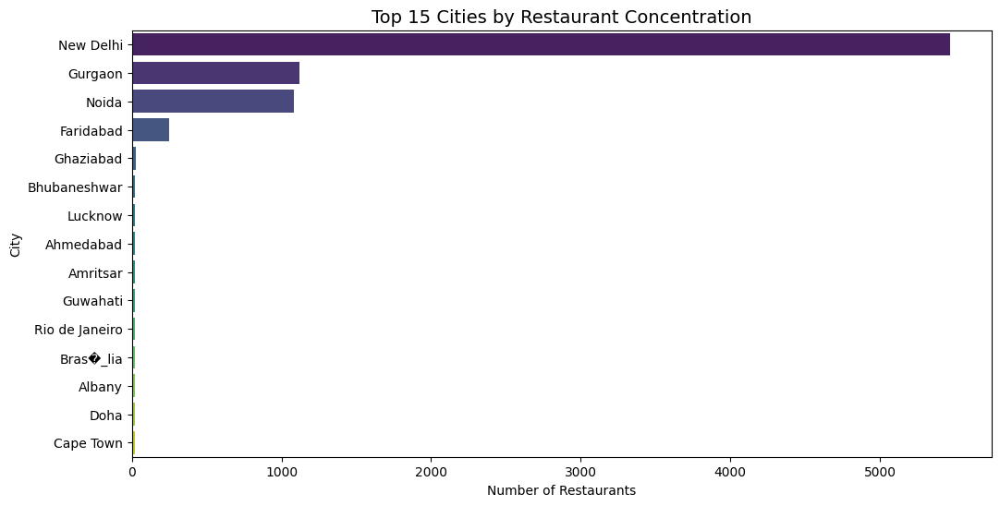

Top 10 Cities by Concentration:
           City  Restaurant Count
0     New Delhi              5473
1       Gurgaon              1118
2         Noida              1080
3     Faridabad               251
4     Ghaziabad                25
5  Bhubaneshwar                21
6       Lucknow                21
7     Ahmedabad                21
8      Amritsar                21
9      Guwahati                21

Top 10 Localities by Concentration:
              Locality  Restaurant Count
0      Connaught Place               122
1       Rajouri Garden                99
2             Shahdara                87
3       Defence Colony                86
4        Malviya Nagar                85
5            Pitampura                85
6  Mayur Vihar Phase 1                84
7       Rajinder Nagar                81
8           Safdarjung                80
9         Satyaniketan                79


In [24]:
city_concentration = df['City'].value_counts().reset_index()
city_concentration.columns = ['City', 'Restaurant Count']

locality_concentration = df['Locality'].value_counts().head(10).reset_index()
locality_concentration.columns = ['Locality', 'Restaurant Count']

plt.figure(figsize=(12, 6))
sns.barplot(
    data=city_concentration.head(15), 
    x='Restaurant Count', 
    y='City', 
    palette='viridis'
)
plt.title('Top 15 Cities by Restaurant Concentration', fontsize=14)
plt.xlabel('Number of Restaurants')
plt.ylabel('City')
plt.show()

print("Top 10 Cities by Concentration:")
print(city_concentration.head(10))

print("\nTop 10 Localities by Concentration:")
print(locality_concentration)

Calculating statistics such as the average ratings,
cuisines, or price ranges by city or locality.

In [ ]:
city_stats = df.groupby('City').agg({
    'Aggregate rating': 'mean',
    'Price range': 'mean',
    'Restaurant ID': 'count'
}).reset_index()

city_stats.columns = ['City', 'Average Rating', 'Average Price Range', 'Restaurant Count']
cuisine_stats = df.groupby('City')['Cuisines'].nunique().reset_index()
cuisine_stats.columns = ['City', 'Unique Cuisines Count']

final_stats = pd.merge(city_stats, cuisine_stats, on='City')
final_stats = final_stats.sort_values(by='Average Rating', ascending=False)

print("Location-Based Statistics (By City):")
print(final_stats.head(10))


plt.figure(figsize=(12, 6))
sns.scatterplot(
    data=final_stats, 
    x='Average Price Range', 
    y='Average Rating', 
    size='Restaurant Count', 
    hue='City',
    sizes=(100, 1000),
    legend=False
)
plt.title('Average Rating vs. Price Range by City')
plt.grid(True)
plt.show()

Identifying any interesting insights or patterns related
to the locations of the restaurants.

In [19]:

correlation_insight = df.groupby('City')[['Price range', 'Aggregate rating']].mean()
delivery_pattern = df.groupby('Locality')['Has Online delivery'].value_counts(normalize=True).unstack().fillna(0)

hidden_gems = df.groupby('Locality').agg({'Aggregate rating': 'mean', 'Votes': 'mean'})
hidden_gems = hidden_gems[(hidden_gems['Aggregate rating'] > 4.0) & (hidden_gems['Votes'] < 100)]

print("Price vs Rating Insight:")
print(correlation_insight.head())
print("\nPotential Hidden Gem Localities:")
print(hidden_gems.head())

Price vs Rating Insight:
           Price range  Aggregate rating
City                                    
Abu Dhabi     3.300000          4.300000
Agra          2.650000          3.965000
Ahmedabad     2.571429          4.161905
Albany        1.700000          3.555000
Allahabad     2.650000          3.395000

Potential Hidden Gem Localities:
                               Aggregate rating  Votes
Locality                                              
Bela Vista, Centro                         4.45   33.0
Bras�_lia Shopping, Asa Norte              4.20   17.0
Cavendish Square, Claremont                4.10   88.0
Centro                                     4.80   29.0
Clatskanie                                 4.30   96.0


1. Where are the restaurants?

   
Looking at the data, we see a massive concentration of restaurants in the National Capital Region, specifically New Delhi, Gurgaon, and Noida. In fact, New Delhi alone has over 5,400 restaurants, with Connaught Place being the most crowded individual neighborhood.

2. Is bigger always better?

   
Interestingly, having the most restaurants doesn't mean having the best ratings. While Delhi has the quantity, smaller areas like Inner City and Quezon City actually have the highest average ratings. This suggests that smaller, more specialized markets might be offering higher quality than the big, crowded hubs.

3. Price vs. Quality

   
We also noticed that in premium markets like Abu Dhabi, high prices usually lead to high ratings. However, in cities like Ahmedabad, there is a great balance where customers get high-quality food for a much lower price.

4. Hidden Gems
   
Finally, we identified 'Hidden Gems' in places like Centro. These are localities with excellent ratings (above 4.4) but very few reviews, meaning they are high-quality spots that haven't become 'mainstream' yet.